In [104]:
import argparse
import yaml
import numpy as np
import pickle as pkl
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error
from itertools import product
from datetime import datetime
import json
import hashlib
import os
import matplotlib.pyplot as plt

In [105]:
with open('bmp_gs_300_600_20_09_PG20230728-001838.pkl', 'rb') as f:
    res_log = pkl.load(f)

In [106]:
100*1000*5*0.5*10/1024

2441.40625

In [107]:
res_log = res_log[0]

In [108]:
res_log['parameters']

{'n': 300,
 'p': 600,
 'm': 20,
 'noise_level_lst': [0.1, 0.2],
 'model_name': 'BMP',
 'cv_num': 5,
 'trial_num': 25,
 'param_grid': {'atom_bag_percent': [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
  'K': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
         35, 37, 39, 41, 43, 45, 47, 49])},
 'fixed_params': {'N_bag': 1000,
  'signal_bag_percent': 0.9,
  'select_atom_percent': 0,
  'replace_flag': False,
  'agg_func': 'weight',
  'ignore_warning': True,
  'random_seed': None}}

In [109]:
res_log_log = res_log['log']

In [110]:
res_log_log[0]

{'noise_level': 0.1,
 'trial': 0,
 'cv_error_lst': array([0.07036458, 0.07017458, 0.07058215, 0.07173759, 0.07270826,
        0.0743015 , 0.07533397, 0.04591389, 0.04541154, 0.04629596,
        0.04773294, 0.0493219 , 0.04998444, 0.05088197, 0.03106171,
        0.03063926, 0.03184005, 0.03287819, 0.03431077, 0.03553008,
        0.03698366, 0.02285398, 0.02249818, 0.02297938, 0.02350808,
        0.02391185, 0.02428216, 0.02451822, 0.01881199, 0.01833046,
        0.01842776, 0.0187335 , 0.01901595, 0.01938208, 0.01968896,
        0.0161656 , 0.01585635, 0.01556341, 0.01552423, 0.01551068,
        0.0154606 , 0.01548888, 0.01499793, 0.01453155, 0.01440672,
        0.01439567, 0.01436076, 0.01441372, 0.01441958, 0.01427102,
        0.01405545, 0.01404961, 0.01411098, 0.01410082, 0.01413052,
        0.01410834, 0.01395492, 0.01390535, 0.01402854, 0.01402063,
        0.01409023, 0.01410516, 0.01414234, 0.01387026, 0.01393789,
        0.01399176, 0.01413797, 0.01417061, 0.01423489, 0.01419426

ValueError: x and y must have same first dimension, but have shapes (25,) and (175,)

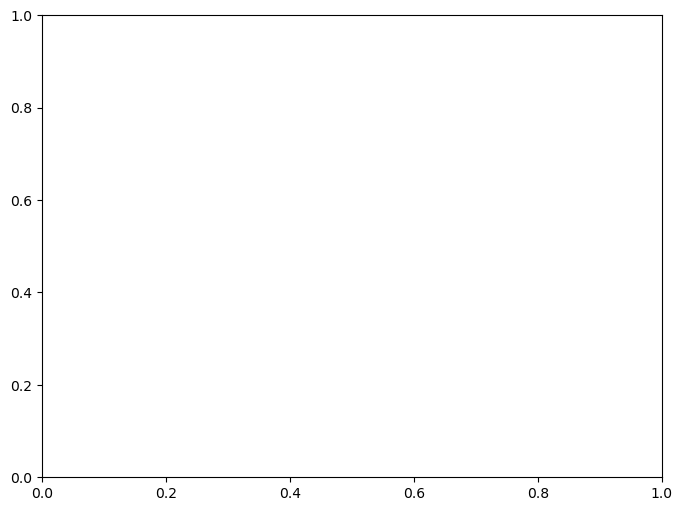

In [111]:
cv_results_lst = []

K_lst = res_log["parameters"]["param_grid"]['K']

for i in range(len(res_log_log)):
    cv_results_lst.append(res_log_log[i]["cv_error_lst"])
    
plt.subplots(figsize=(8, 6))
for i in range(len(cv_results_lst)):
    plt.plot(K_lst, cv_results_lst[i], label="Trial {}".format(i+1))

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title("CV Error vs. K \n n = 300, p = 600, m = 20, noise std = 0.12\nN_bag =500, n_percent = 0.8, p_percent = 0.9, no replacement")
plt.xlabel("K")
plt.ylabel("CV Error")
plt.show()


In [ ]:
def cal_corr(res_log_log):
    avg_corr_lst = []
    for i in range(len(res_log_log)):
        coef_lst = res_log_log[i]['coef_lst']
        corr = np.corrcoef(coef_lst)
        avg_corr = np.mean(corr)
        avg_corr_lst.append(avg_corr)
        
    import seaborn as sns
    sns.boxplot(x=avg_corr_lst)
    plt.xlim(0, 1)
        
    print("Avg correlation: ", np.mean(avg_corr_lst))

Avg correlation:  0.910950849050609


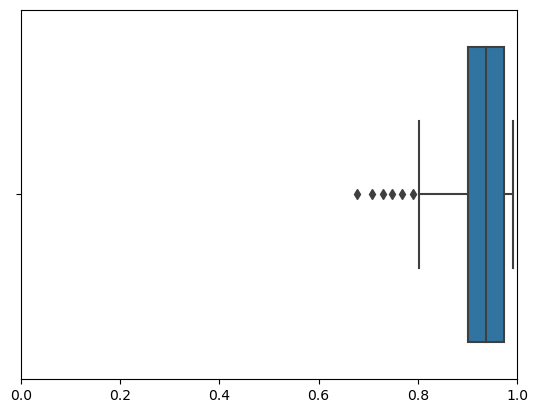

In [112]:
cal_corr(res_log_log)

In [113]:
coef_lst = res_log_log[0]['coef_lst']
corr = np.corrcoef(coef_lst)
corr.shape

(1000, 1000)